In [1]:
#install.packages("rstan", repos= "https://cloud.r-project.org")
options(mc.cores = parallel::detectCores())
require(rstan)
rstan_options(auto_write = TRUE)
Sys.setenv(LOCAL_CPPFLAGS = '-march=corei7 -mtune=corei7')

Loading required package: rstan

Loading required package: StanHeaders

Loading required package: ggplot2

rstan (Version 2.21.2, GitRev: 2e1f913d3ca3)

For execution on a local, multicore CPU with excess RAM we recommend calling
options(mc.cores = parallel::detectCores()).
To avoid recompilation of unchanged Stan programs, we recommend calling
rstan_options(auto_write = TRUE)



In [2]:
# Define the model

stan.pca.ard.code <- "
    data{
        int<lower=1> M; //Number of dimensions of the latent space
        int<lower=1> D; //Number of dimensions of the data space 
        int<lower=1> N; //Number of samples
        matrix[D,N] X; // data matrix
    }

    transformed data {

        //Zero vector for the mean of the Z prior  
        vector<lower=0>[M] Mu_z = rep_vector(0, M);     

        // Unit covariance matrix for the z prior
        matrix[M,M] Sigma_mu = diag_matrix(rep_vector(1, M));

    }

    parameters{
        // X distribution mu and covariance
        real<lower=0> Sigma_x;

        // ARD prior for W
        vector<lower=0>[M] alpha;
        
        // PCA matrices
        matrix[D,M] W; //Predictors matrix
        matrix[M,N] Z; //Latent matrix (one column per sample)
    }

    transformed parameters{
        vector<lower=0>[M] t_alpha;
        real<lower=0> t_Sigma_x;

        t_alpha = inv(sqrt(alpha));    
        t_Sigma_x = inv(sqrt(Sigma_x));
}
    
    model{
        Sigma_x ~ gamma(1,1);
        alpha ~ gamma(1e-3, 1e-3);

        for(m in 1:M) W[:,m] ~ normal(0, t_alpha[m]);

        for (n in 1:N){
            Z[:,n] ~ multi_normal(Mu_z, Sigma_mu); //0 mean, unit variance
            X[:,n] ~ multi_normal(W * Z[:,n], diag_matrix(rep_vector(t_Sigma_x, D)));
        }
    }
"


In [4]:
# Define the model

stan.pca.code <- "
    data{
        int<lower=1> m; //Number of dimensions of the latent space
        int<lower=1> d; //Number of dimensions of the data space 
        int<lower=1> n; //Number of samples
        matrix[d,n] X; // data matrix
    }

    transformed data {

        //Zero vector for the mean of the Z prior  
        vector<lower=0>[m] Mu_z = rep_vector(0, m);     

        // Unit covariance matrix for the z prior
        matrix[m,m] Sigma_mu = diag_matrix(rep_vector(1, m));

    }

    parameters{
        // X distribution mu and covariance
        // vector[d] Mu_x;
        // vector<lower=0>[d] Sigma_x;
        // matrix[d,d] Sigma_x;
        real<lower=0> Sigma_x;
        
        
        // PCA matrices
        matrix[m,n] Z; //Latent matrix (one column per sample)
        matrix[d,m] W; //Predictors matrix
    }
    
    model{
        for (i in 1:n){
            Z[:,i] ~ multi_normal(Mu_z, Sigma_mu);
            X[:,i] ~ multi_normal(W * Z[:,i], diag_matrix(rep_vector(Sigma_x, d)));
            // X[:,i] ~ multi_normal(W * Z[:,i] + Mu_x, diag_matrix(Sigma_x));
        }
    }
"

In [3]:
data <- readRDS("Data/ProcessedDatasets/UK_all_time_decathlon.RDS")
data[1:4,]
data <- data[data$Year != 'PB', ]
data <- as.matrix(data[,-c(11,12)])
data[1:4,]
dim(data)

,100,LJ,SP7.26K,HJ,400,110H,DT2K,PV,JT800,1500,Year,Athlete
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>
PB,11.02,7.14,15.19,2.04,50.65,15.15,53.94,4.60,58.14,278.46,PB,105383
2015,11.19,7.02,15.19,1.99,50.65,15.15,53.94,4.36,55.04,289.21,2015,105383
2014,11.03,7.14,15.06,2.04,51.24,15.33,51.47,4.60,58.14,294.06,2014,105383
2013,11.14,6.99,14.40,2.04,51.22,15.81,49.65,4.20,53.86,278.46,2013,105383


,100,LJ,SP7.26K,HJ,400,110H,DT2K,PV,JT800,1500
2015,11.19,7.02,15.19,1.99,50.65,15.15,53.94,4.36,55.04,289.21
2014,11.03,7.14,15.06,2.04,51.24,15.33,51.47,4.60,58.14,294.06
2013,11.14,6.99,14.40,2.04,51.22,15.81,49.65,4.20,53.86,278.46
2012,11.02,7.05,14.31,1.95,50.70,15.63,44.60,4.12,53.61,284.49


[1] 258  10

In [ ]:
# Add the data
stan.data <- list(m=10, # visualization
                  d=ncol(data),
                  n=nrow(data),
                  X=t(data))

# Run
stan.pca <- stan(model_code = stan.pca.code, data = stan.data, iter = 3500,
             chains = 3, verbose = FALSE, seed=101, warmup=500,
                control = list(adapt_delta = 0.99, max_treedepth = 15))
saveRDS(stan.pca, file='stan_pca_01.RDS')

In [7]:
# Add the data
stan.data <- list(m=ncol(data)-1,
                  d=ncol(data),
                  n=nrow(data),
                  X=t(data))

# Run
stan.pca <- stan(model_code = stan.pca.code, data = stan.data, iter = 3500,
             chains = 3, verbose = FALSE, seed=101, warmup=500)
saveRDS(stan.pca, file='stan_pca_02.RDS')

Warning message:
“There were 6000 transitions after warmup that exceeded the maximum treedepth. Increase max_treedepth above 10. See
http://mc-stan.org/misc/warnings.html#maximum-treedepth-exceeded”
Warning message:
“There were 3 chains where the estimated Bayesian Fraction of Missing Information was low. See
http://mc-stan.org/misc/warnings.html#bfmi-low”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”
Warning message:
“The largest R-hat is 3.76, indicating chains have not mixed.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#r-hat”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more itera

In [22]:
# Add the data
stan.data <- list(M=ncol(data)-1,
                  D=ncol(data),
                  N=nrow(data),
                  X=t(data))

# Run
stan.pca <- stan(model_code = stan.pca.ard.code, data = stan.data, iter = 2500,
             chains = 3, verbose = FALSE, seed=101, warmup=500)
saveRDS(stan.pca, file='stan_pca_03.RDS')

Warning message:
“There were 6000 transitions after warmup that exceeded the maximum treedepth. Increase max_treedepth above 10. See
http://mc-stan.org/misc/warnings.html#maximum-treedepth-exceeded”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”
Warning message:
“The largest R-hat is 3.07, indicating chains have not mixed.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#r-hat”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#tail-ess”


In [ ]:
# Add the data
stan.data <- list(M=ncol(data)-1,
                  D=ncol(data),
                  N=nrow(data),
                  X=t(scale(data, center=TRUE)))

m <- stan_model(model_code = stan.pca.ard.code)
stan.pca.vb <- vb(m, data = stan.data, algorithm = "meanfield", tol_rel_obj=0.0001, iter=100000)
saveRDS(stan.pca.vb, file='stan_pca_05.RDS')
# Pareto k diagnostic value is 3.56

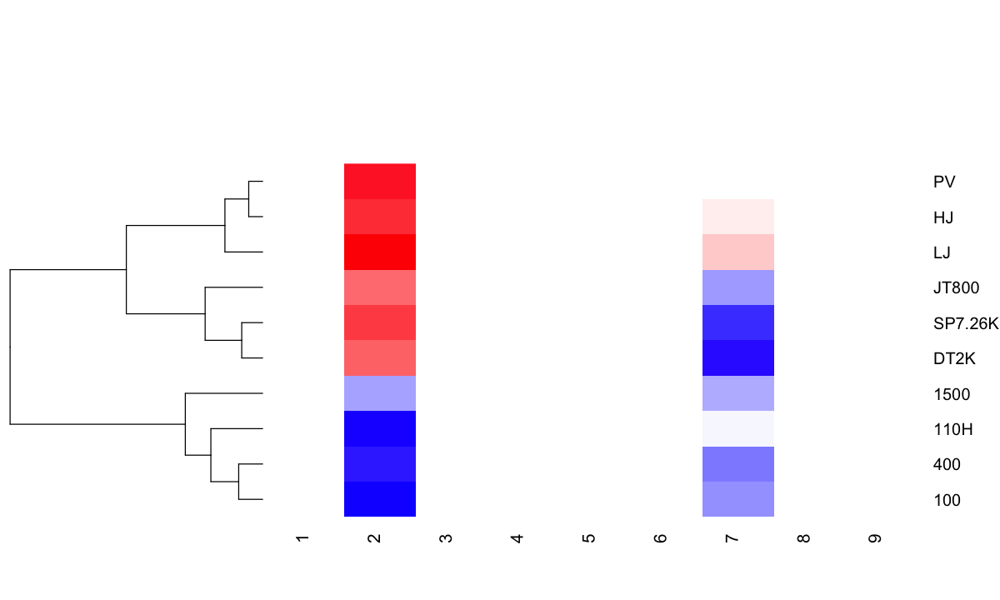

In [15]:
W.vb <- readRDS("Stan_results//stan_pca_05.RDS")
W.vb <- apply(extract(W.vb,"W")[[1]], c(2,3), MAP)
row.names(W.vb) <- colnames(data)
heatmap.2(W.vb, col = bluered(70), dendrogram='row',trace='none', Rowv = TRUE, Colv = FALSE, key=FALSE)

In [6]:
# Add the data
stan.data <- list(M=5,
                  D=ncol(data),
                  N=nrow(data),
                  X=t(scale(data, center=TRUE)))

stan.pca <- stan(model_code = stan.pca.ard.code, data = stan.data, iter = 5000,
             chains =  3, verbose = FALSE, seed=101, warmup=500, control = list(max_treedepth = 15))

saveRDS(stan.pca, file='stan_pca_06.RDS')

Warning message:
“The largest R-hat is 1.15, indicating chains have not mixed.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#r-hat”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#tail-ess”


In [ ]:
options(repr.plot.width=10, repr.plot.height=10)
pairs(stan.pca, pars="W")

In [9]:
row.names(summary(stan.pca)$summary)


[1] "Sigma_x"    "alpha[1]"   "alpha[2]"   "alpha[3]"   "alpha[4]"  
   [6] "alpha[5]"   "W[1,1]"     "W[1,2]"     "W[1,3]"     "W[1,4]"    
  [11] "W[1,5]"     "W[2,1]"     "W[2,2]"     "W[2,3]"     "W[2,4]"    
  [16] "W[2,5]"     "W[3,1]"     "W[3,2]"     "W[3,3]"     "W[3,4]"    
  [21] "W[3,5]"     "W[4,1]"     "W[4,2]"     "W[4,3]"     "W[4,4]"    
  [26] "W[4,5]"     "W[5,1]"     "W[5,2]"     "W[5,3]"     "W[5,4]"    
  [31] "W[5,5]"     "W[6,1]"     "W[6,2]"     "W[6,3]"     "W[6,4]"    
  [36] "W[6,5]"     "W[7,1]"     "W[7,2]"     "W[7,3]"     "W[7,4]"    
  [41] "W[7,5]"     "W[8,1]"     "W[8,2]"     "W[8,3]"     "W[8,4]"    
  [46] "W[8,5]"     "W[9,1]"     "W[9,2]"     "W[9,3]"     "W[9,4]"    
  [51] "W[9,5]"     "W[10,1]"    "W[10,2]"    "W[10,3]"    "W[10,4]"   
  [56] "W[10,5]"    "Z[1,1]"     "Z[1,2]"     "Z[1,3]"     "Z[1,4]"    
  [61] "Z[1,5]"     "Z[1,6]"     "Z[1,7]"     "Z[1,8]"     "Z[1,9]"    
  [66] "Z[1,10]"    "Z[1,11]"    "Z[1,12]"    "Z[1,13]"    "Z[1,14]"   
  [71] "Z[1,15]"    "Z[1,16]"    "Z[1,17]"    "Z[1,18]"    "Z[1,19]"   
  [76] "Z[1,20]"    "Z[1,21]"    "Z[1,22]"    "Z[1,23]"    "Z[1,24]"   
  [81] "Z[1,25]"    "Z[1,26]"    "Z[1,27]"    "Z[1,28]"    "Z[1,29]"   
  [86] "Z[1,30]"    "Z[1,31]"    "Z[1,32]"    "Z[1,33]"    "Z[1,34]"   
  [91] "Z[1,35]"    "Z[1,36]"    "Z[1,37]"    "Z[1,38]"    "Z[1,39]"   
  [96] "Z[1,40]"    "Z[1,41]"    "Z[1,42]"    "Z[1,43]"    "Z[1,44]"   
 [101] "Z[1,45]"    "Z[1,46]"    "Z[1,47]"    "Z[1,48]"    "Z[1,49]"   
 [106] "Z[1,50]"    "Z[1,51]"    "Z[1,52]"    "Z[1,53]"    "Z[1,54]"   
 [111] "Z[1,55]"    "Z[1,56]"    "Z[1,57]"    "Z[1,58]"    "Z[1,59]"   
 [116] "Z[1,60]"    "Z[1,61]"    "Z[1,62]"    "Z[1,63]"    "Z[1,64]"   
 [121] "Z[1,65]"    "Z[1,66]"    "Z[1,67]"    "Z[1,68]"    "Z[1,69]"   
 [126] "Z[1,70]"    "Z[1,71]"    "Z[1,72]"    "Z[1,73]"    "Z[1,74]"   
 [131] "Z[1,75]"    "Z[1,76]"    "Z[1,77]"    "Z[1,78]"    "Z[1,79]"   
 [136] "Z[1,80]"    "Z[1,81]"    "Z[1,82]"    "Z[1,83]"    "Z[1,84]"   
 [141] "Z[1,85]"    "Z[1,86]"    "Z[1,87]"    "Z[1,88]"    "Z[1,89]"   
 [146] "Z[1,90]"    "Z[1,91]"    "Z[1,92]"    "Z[1,93]"    "Z[1,94]"   
 [151] "Z[1,95]"    "Z[1,96]"    "Z[1,97]"    "Z[1,98]"    "Z[1,99]"   
 [156] "Z[1,100]"   "Z[1,101]"   "Z[1,102]"   "Z[1,103]"   "Z[1,104]"  
 [161] "Z[1,105]"   "Z[1,106]"   "Z[1,107]"   "Z[1,108]"   "Z[1,109]"  
 [166] "Z[1,110]"   "Z[1,111]"   "Z[1,112]"   "Z[1,113]"   "Z[1,114]"  
 [171] "Z[1,115]"   "Z[1,116]"   "Z[1,117]"   "Z[1,118]"   "Z[1,119]"  
 [176] "Z[1,120]"   "Z[1,121]"   "Z[1,122]"   "Z[1,123]"   "Z[1,124]"  
 [181] "Z[1,125]"   "Z[1,126]"   "Z[1,127]"   "Z[1,128]"   "Z[1,129]"  
 [186] "Z[1,130]"   "Z[1,131]"   "Z[1,132]"   "Z[1,133]"   "Z[1,134]"  
 [191] "Z[1,135]"   "Z[1,136]"   "Z[1,137]"   "Z[1,138]"   "Z[1,139]"  
 [196] "Z[1,140]"   "Z[1,141]"   "Z[1,142]"   "Z[1,143]"   "Z[1,144]"  
 [201] "Z[1,145]"   "Z[1,146]"   "Z[1,147]"   "Z[1,148]"   "Z[1,149]"  
 [206] "Z[1,150]"   "Z[1,151]"   "Z[1,152]"   "Z[1,153]"   "Z[1,154]"  
 [211] "Z[1,155]"   "Z[1,156]"   "Z[1,157]"   "Z[1,158]"   "Z[1,159]"  
 [216] "Z[1,160]"   "Z[1,161]"   "Z[1,162]"   "Z[1,163]"   "Z[1,164]"  
 [221] "Z[1,165]"   "Z[1,166]"   "Z[1,167]"   "Z[1,168]"   "Z[1,169]"  
 [226] "Z[1,170]"   "Z[1,171]"   "Z[1,172]"   "Z[1,173]"   "Z[1,174]"  
 [231] "Z[1,175]"   "Z[1,176]"   "Z[1,177]"   "Z[1,178]"   "Z[1,179]"  
 [236] "Z[1,180]"   "Z[1,181]"   "Z[1,182]"   "Z[1,183]"   "Z[1,184]"  
 [241] "Z[1,185]"   "Z[1,186]"   "Z[1,187]"   "Z[1,188]"   "Z[1,189]"  
 [246] "Z[1,190]"   "Z[1,191]"   "Z[1,192]"   "Z[1,193]"   "Z[1,194]"  
 [251] "Z[1,195]"   "Z[1,196]"   "Z[1,197]"   "Z[1,198]"   "Z[1,199]"  
 [256] "Z[1,200]"   "Z[1,201]"   "Z[1,202]"   "Z[1,203]"   "Z[1,204]"  
 [261] "Z[1,205]"   "Z[1,206]"   "Z[1,207]"   "Z[1,208]"   "Z[1,209]"  
 [266] "Z[1,210]"   "Z[1,211]"   "Z[1,212]"   "Z[1,213]"   "Z[1,214]"  
 [271] "Z[1,215]"   "Z[1,216]"   "Z[1,217]"   "Z[1,218]"   "Z[1,219]"  
 [276] "Z[1,220]"   "Z[1,221]"   "Z[1,222]"

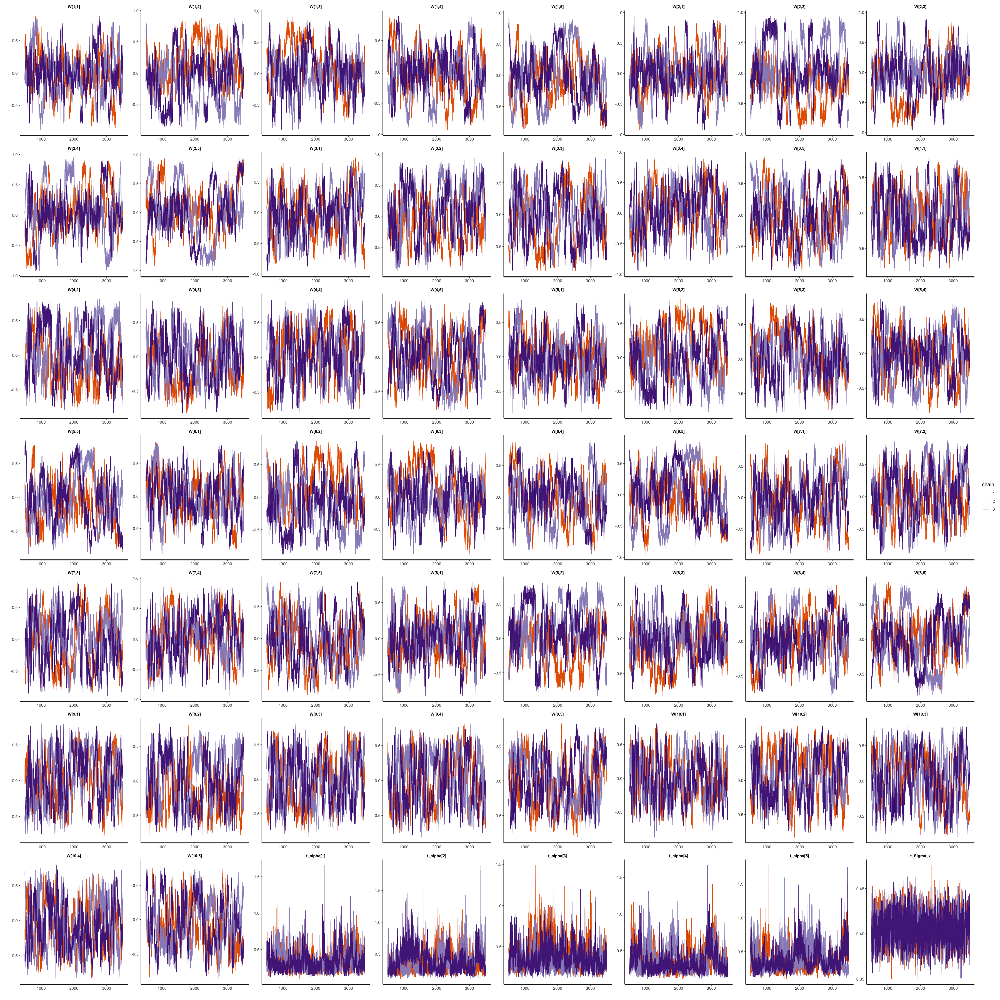

In [10]:
# Trace plots
options(repr.plot.width=30, repr.plot.height=30)
stan_trace(stan.pca, pars=c("W","t_alpha","t_Sigma_x"))

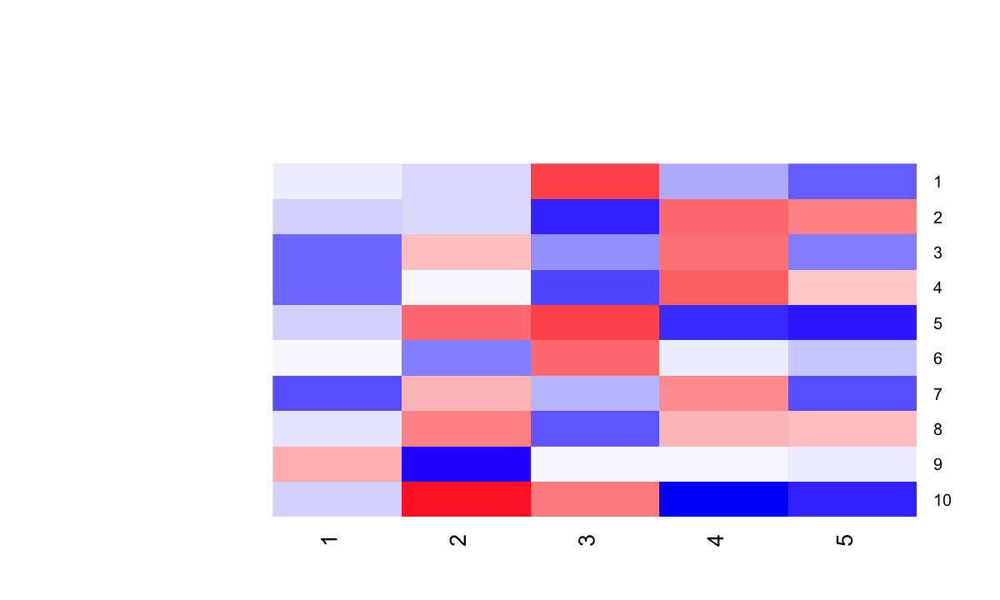

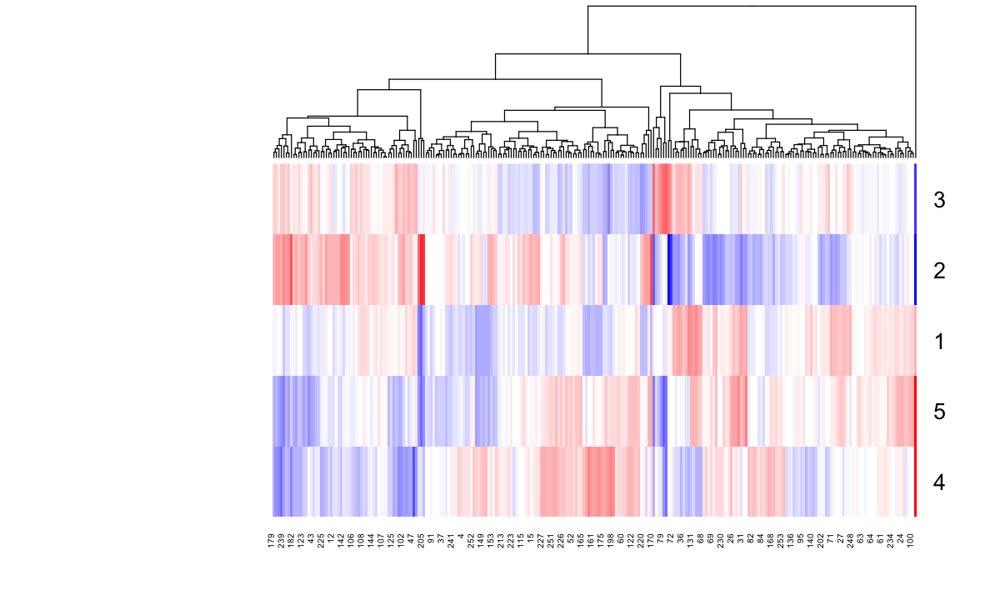

In [16]:
require(gplots)
options(repr.plot.width=10, repr.plot.height=6)

W6 <- apply(extract(stan.pca,"W")[[1]], c(2,3), mean)
heatmap.2(W6, col = bluered(70), dendrogram='none',trace='none', Rowv = FALSE, Colv = FALSE, key=FALSE)

Z6 <- apply(extract(stan.pca,"Z")[[1]], c(2,3), mean)
heatmap.2(Z6, col = bluered(70), dendrogram ='column',trace='none', Rowv = TRUE, Colv = TRUE, key=FALSE)

In [18]:
# Add the data
stan.data <- list(M=5,
                  D=ncol(data),
                  N=nrow(data),
                  X=t(scale(data, center=TRUE)))

stan.pca <- stan(model_code = stan.pca.ard.code, data = stan.data, iter = 7500,
             chains =  3, verbose = FALSE, seed=101, warmup=500, control = list(max_treedepth = 15))

saveRDS(stan.pca, file='stan_pca_07.RDS')

Warning message:
“The largest R-hat is 1.08, indicating chains have not mixed.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#r-hat”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#tail-ess”


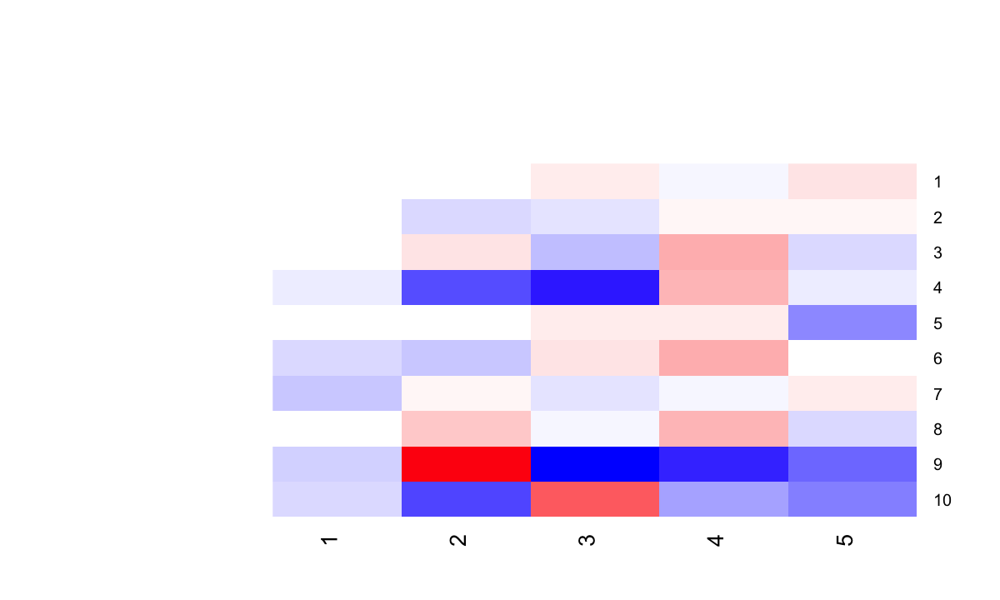

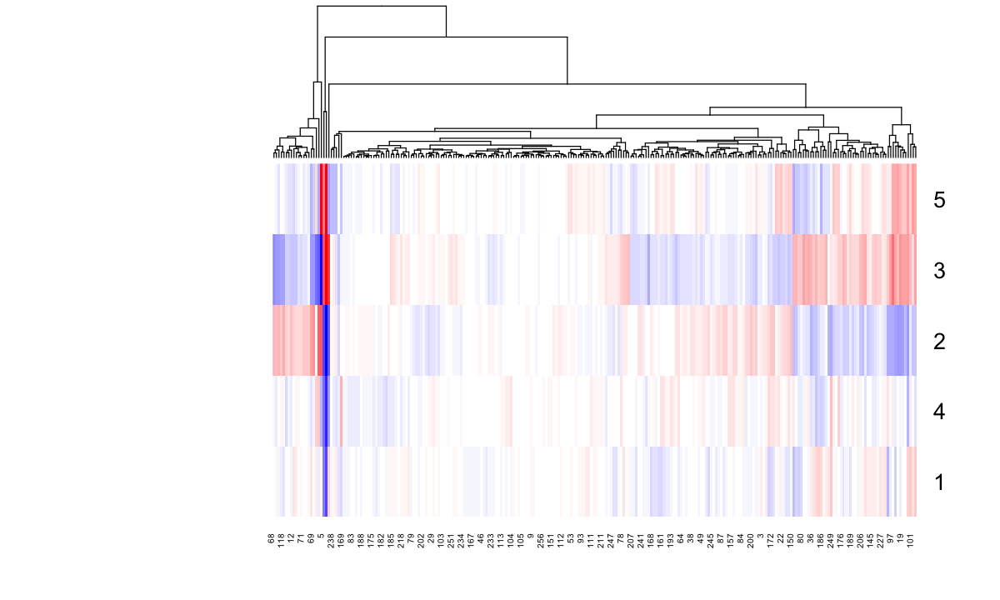

In [21]:
# Let's use the maximum a posteriori estimates of the different parameters to build the final model
MAP <- function(t){
    A<-density(t)
    return(A$x[which.max(A$y)])
}

require(gplots)
options(repr.plot.width=10, repr.plot.height=6)

W6 <- apply(extract(stan.pca,"W")[[1]], c(2,3), MAP)
heatmap.2(W6, col = bluered(70), dendrogram='none',trace='none', Rowv = FALSE, Colv = FALSE, key=FALSE)

Z6 <- apply(extract(stan.pca,"Z")[[1]], c(2,3), MAP)
heatmap.2(Z6, col = bluered(70), dendrogram ='column',trace='none', Rowv = TRUE, Colv = TRUE, key=FALSE)

In [ ]:
stats = summary(stan.pca)$summary
stats[stats[,'Rhat'] > 1.05, ]

mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat


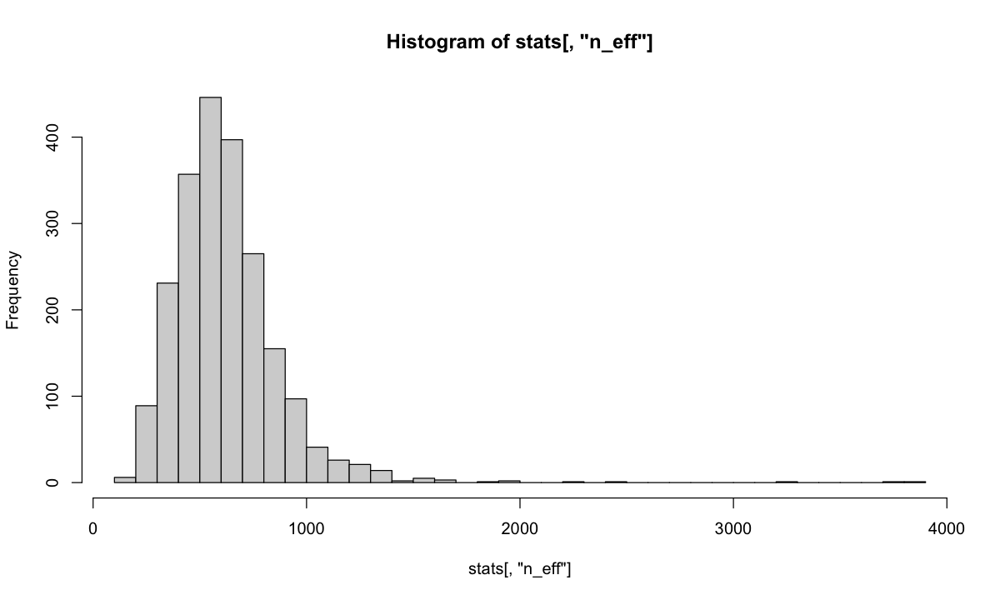

In [11]:
stan_pca <- readRDS("Stan_results/stan_pca_07.RDS")

stats = summary(stan.pca)$summary
stats[stats[ , 'n_eff'] < 100,]
hist(stats[ , 'n_eff'], breaks=50) # We should have a 10% of effective samples, but in soome cases we have less than 1%

,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
alpha[3],11.906207884,0.90655123,8.9246871,1.8966630,5.3956554,9.4895183454,16.0090773,34.5990707,96.91730,1.030642
"W[1,1]",-0.005650692,0.03093030,0.3084685,-0.6626144,-0.1841283,-0.0004434159,0.1701857,0.6508205,99.46111,1.002113
"W[1,2]",-0.009351660,0.07798623,0.3758090,-0.7252813,-0.2376646,-0.0090443355,0.2147610,0.7130396,23.22194,1.122968
"W[1,3]",0.049979768,0.05370875,0.3228332,-0.6345913,-0.1529116,0.0402184380,0.2630740,0.6786196,36.12987,1.112688
"W[1,4]",-0.022206115,0.04379147,0.3519883,-0.7163079,-0.2457886,-0.0087275429,0.2009463,0.6694322,64.60667,1.075855
"W[1,5]",-0.041573608,0.06200712,0.3824535,-0.7155659,-0.3101417,-0.0468270723,0.1925113,0.7250608,38.04295,1.068228
"W[2,2]",-0.009826312,0.08614413,0.4080331,-0.7616263,-0.2488031,-0.0296004432,0.1948422,0.7972289,22.43569,1.156191
"W[2,3]",-0.056753627,0.05206798,0.3406130,-0.7463762,-0.2476449,-0.0441241256,0.1435398,0.6783469,42.79381,1.101159
"W[2,4]",0.039699976,0.04617464,0.3667771,-0.7398769,-0.1674109,0.0207493200,0.2334351,0.7869481,63.09538,1.067503
"W[2,5]",0.033739065,0.06571618,0.4042012,-0.7795971,-0.1955531,0.0298810122,0.2641643,0.7913668,37.83125,1.090807


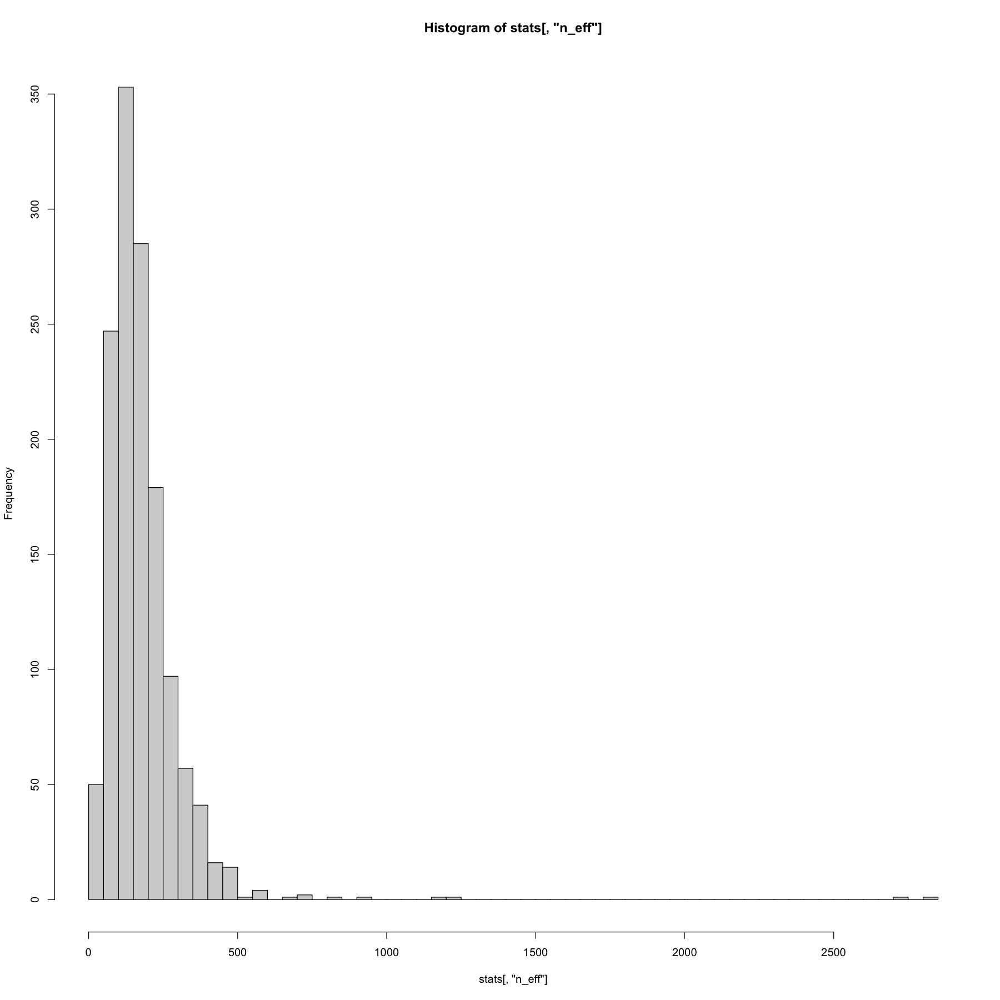

In [44]:
# Let's check what we had obtained with less samples
stan_pca_old <- readRDS("stan_pca_06.RDS")
stats = summary(stan_pca_old)$summary
stats[stats[ , 'n_eff'] < 100,]
hist(stats[ , 'n_eff'], breaks=50) # We should have a 10% of effective samples, but in soome cases we have less than 1%

In [ ]:
stan_pca_old

In [ ]:
options(repr.plot.width=15, repr.plot.height=15)

pairs(stan.pca, pars=c("W"))

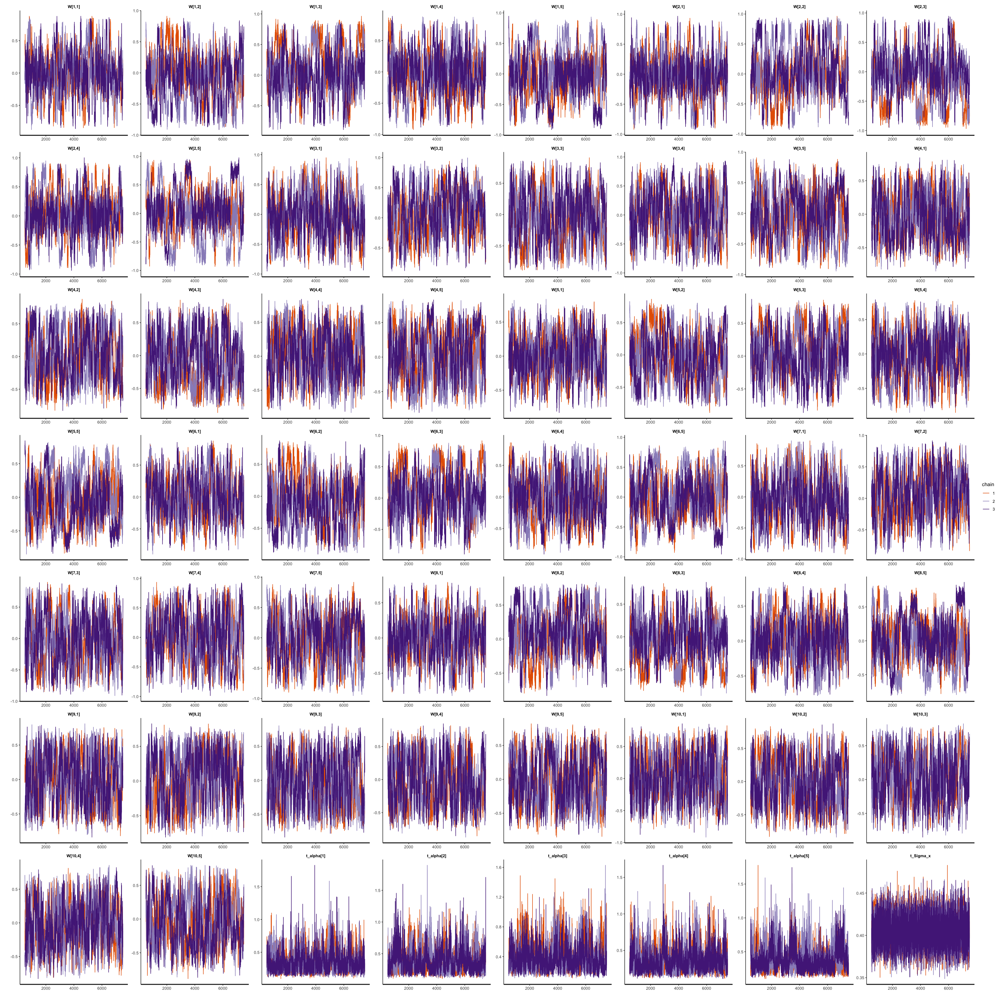

In [25]:
# Trace plots
options(repr.plot.width=30, repr.plot.height=30)
stan_trace(stan.pca, pars=c("W","t_alpha","t_Sigma_x"))

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



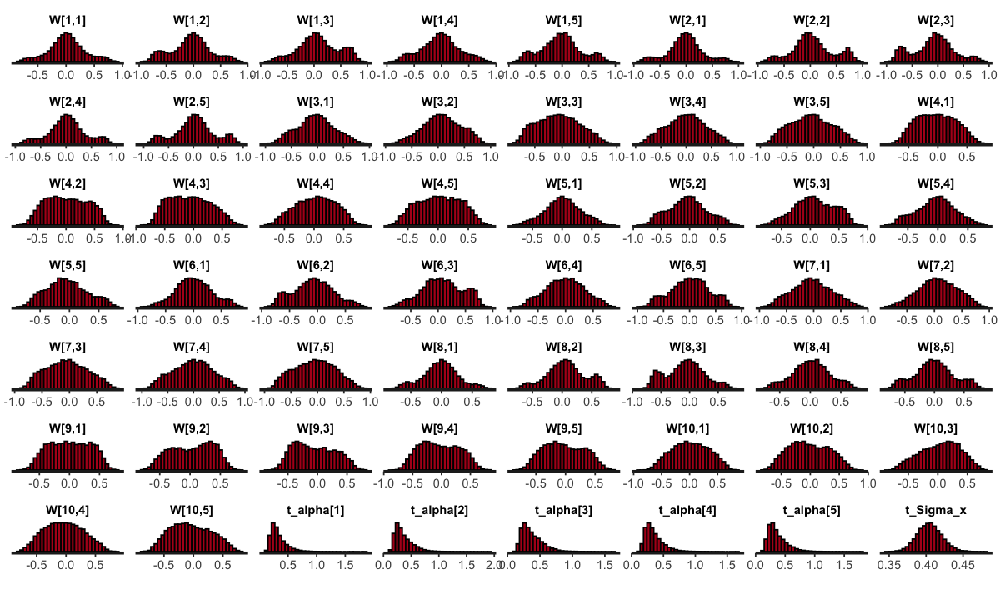

In [24]:
stan_hist(stan.pca, pars=c("W","t_alpha","t_Sigma_x"))

In [107]:
colnames(data)

[1] "100"     "LJ"      "SP7.26K" "HJ"      "400"     "110H"    "DT2K"   
 [8] "PV"      "JT800"   "1500"

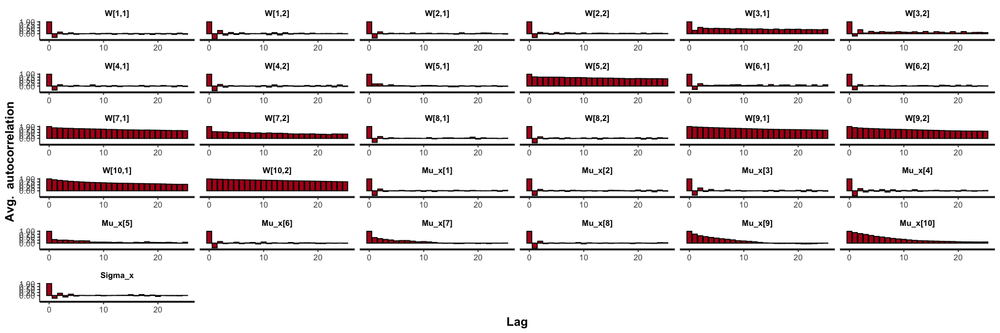

In [110]:
# Auto-correlation
options(repr.plot.width=30, repr.plot.height=30)
stan_ac(stan.pca, pars=c("W","Mu_x","Sigma_x"))

ci_level: 0.8 (80% intervals)

outer_level: 0.95 (95% intervals)



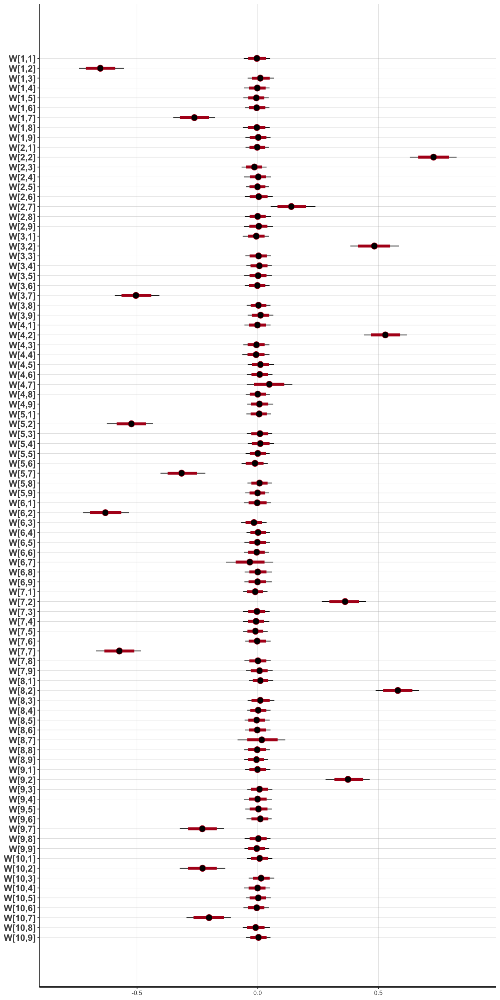

In [54]:
options(repr.plot.width=10, repr.plot.height=20)
stan_plot(stan.pca.vb, pars="W")

In [33]:
options(repr.plot.width=10, repr.plot.height=6)
stan_plot(stan.pca, pars="Mu_x")

ERROR: Error in check_pars(allpars, pars): no parameter Mu_x


In [ ]:
# Let's use the maximum a posteriori estimates of the different parameters to build the final model
MAP <- function(t){
    A<-density(t)
    return(A$x[which.max(A$y)])
}
y.MAP<-apply(logit.stan.preds,2,MAP)
str(y.MAP)

In [111]:
summary <- summary(stan.pca)$summary
#logit.stan.preds <- logit.stan.summary[grepl('y', row.names(logit.stan.summary)), ]

In [ ]:
summary

In [46]:
# Add the data
stan.data <- list(M=5,
                  D=ncol(data),
                  N=nrow(data),
                  X=t(scale(data, center=TRUE)))

stan.pca <- stan(model_code = stan.pca.ard.code, data = stan.data, iter = 15000,
             chains =  3, verbose = FALSE, seed=101, warmup=500, control = list(max_treedepth = 15))

saveRDS(stan.pca, file='stan_pca_09_ard15k.RDS')

Warning message:
“The largest R-hat is 1.06, indicating chains have not mixed.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#r-hat”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#tail-ess”


,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
"W[1,3]",0.08011021,0.04140180,0.3808510,-0.6798295,-0.169671,0.05381157,0.3609428,0.7471788,84.61976,1.055800
"W[2,3]",-0.09262986,0.05648251,0.4028089,-0.8064812,-0.354315,-0.05929405,0.1545628,0.7276734,50.85927,1.062398
"W[5,3]",0.07040038,0.04134364,0.3487090,-0.6089404,-0.180157,0.06263519,0.3523015,0.6621196,71.13918,1.049225
"Z[3,77]",0.33090605,0.22713957,1.7473918,-3.0057402,-0.951246,0.32677732,1.7619061,3.2781239,59.18273,1.050102
"Z[3,174]",-0.24099333,0.13075070,1.1897697,-2.3055176,-1.176765,-0.25348895,0.6302104,2.0315519,82.80141,1.041442
"Z[3,175]",-0.24281277,0.11978192,1.1854325,-2.2906951,-1.188720,-0.24721016,0.6212528,2.0273803,97.94250,1.037952
"Z[3,209]",-0.36107839,0.16033073,1.5241861,-3.0828267,-1.465792,-0.29507903,0.6529017,2.6704495,90.37378,1.043919


,mean,se_mean,sd,2.5%,25%,50%,75%,97.5%,n_eff,Rhat
"W[1,3]",0.08011021,0.04140180,0.3808510,-0.6798295,-0.1696710,0.05381157,0.3609428,0.7471788,84.61976,1.055800
"W[2,3]",-0.09262986,0.05648251,0.4028089,-0.8064812,-0.3543150,-0.05929405,0.1545628,0.7276734,50.85927,1.062398
"W[3,5]",-0.03678841,0.03068307,0.3720630,-0.7142865,-0.3082056,-0.04482300,0.2216223,0.6831299,147.03995,1.021743
"W[4,3]",-0.06517012,0.03273694,0.3564732,-0.6479232,-0.3648407,-0.07995912,0.2193719,0.5918022,118.57073,1.044969
"W[5,3]",0.07040038,0.04134364,0.3487090,-0.6089404,-0.1801570,0.06263519,0.3523015,0.6621196,71.13918,1.049225
"W[6,3]",0.08056218,0.03428726,0.3707076,-0.6420194,-0.1828102,0.07210491,0.3592653,0.7185036,116.89536,1.043755
"W[8,3]",-0.07760366,0.03381160,0.3383329,-0.6700717,-0.3168393,-0.06218196,0.1484873,0.5984655,100.12829,1.047908
"W[9,3]",-0.05138555,0.02082888,0.3366006,-0.5923220,-0.3355723,-0.07876647,0.2250808,0.5706275,261.15485,1.020823
"Z[3,13]",-0.14656829,0.06268643,0.9600844,-1.7969750,-0.8991085,-0.19989643,0.5789595,1.7019916,234.56958,1.027063
"Z[3,15]",-0.16987703,0.08853588,0.9852155,-1.8764267,-0.9449758,-0.19089472,0.5626900,1.7106300,123.82942,1.032659


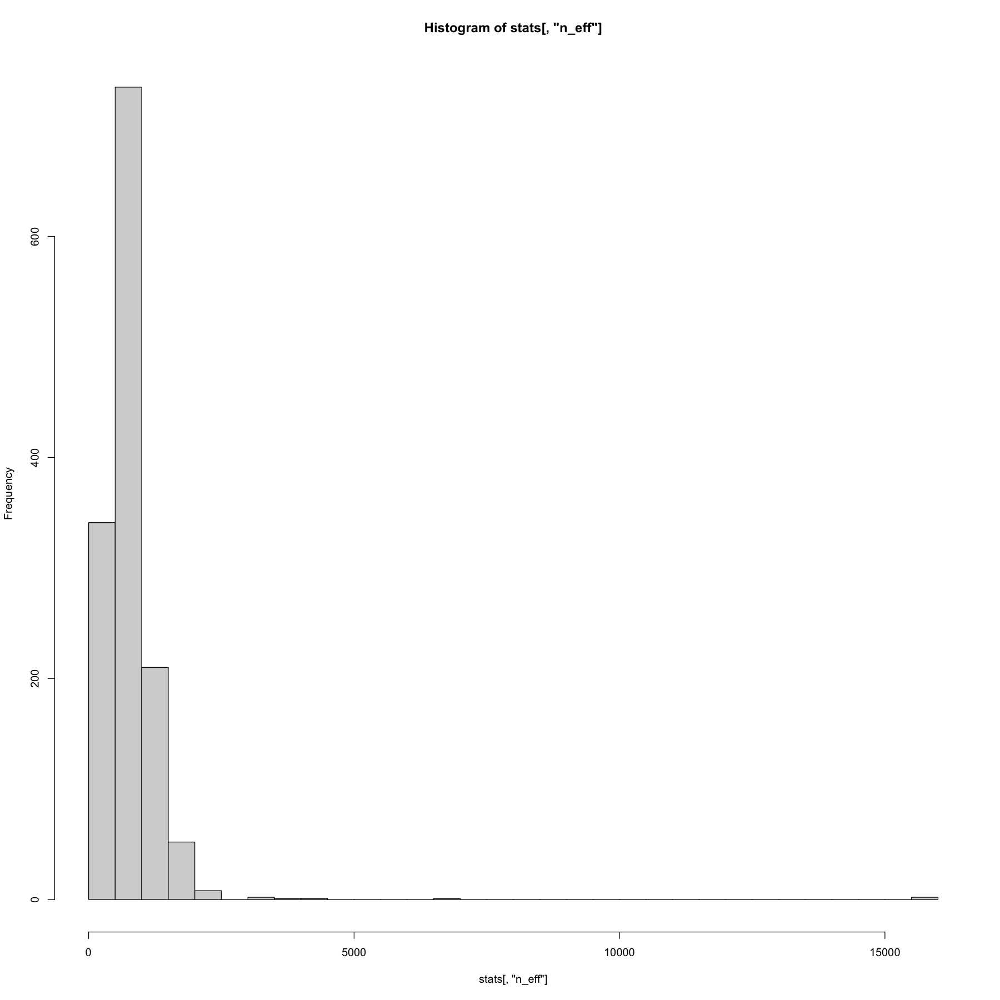

In [49]:
# Let's check what we had obtained with less samples
# stats = summary(stan.pca)$summary
stats[stats[ , 'n_eff'] < 100,]
hist(stats[ , 'n_eff'], breaks=50) # We should have a 10% of effective samples, but in soome cases we have less than 1%
stats[stats[ , 'Rhat'] > 1.02,]

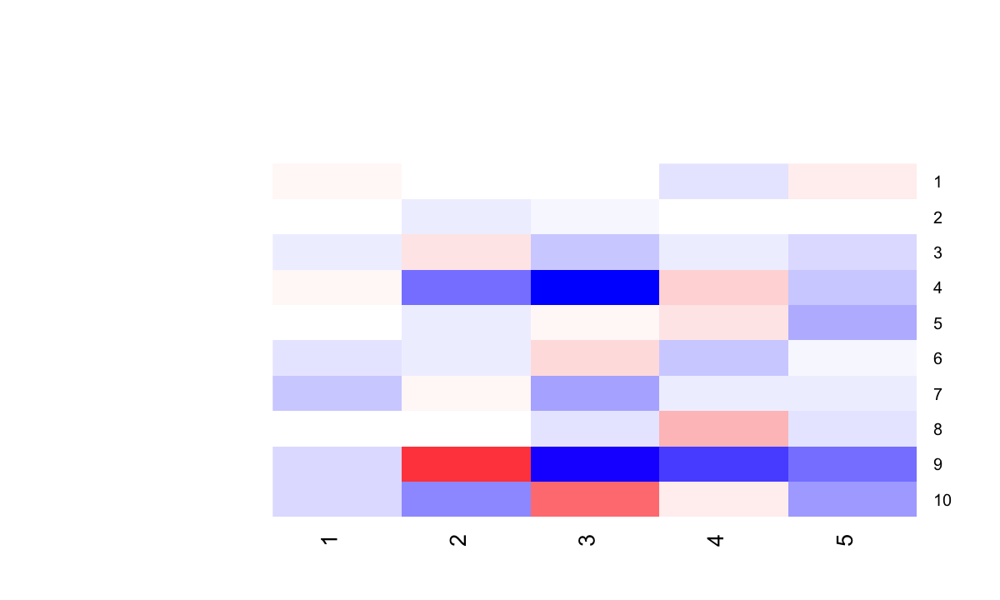

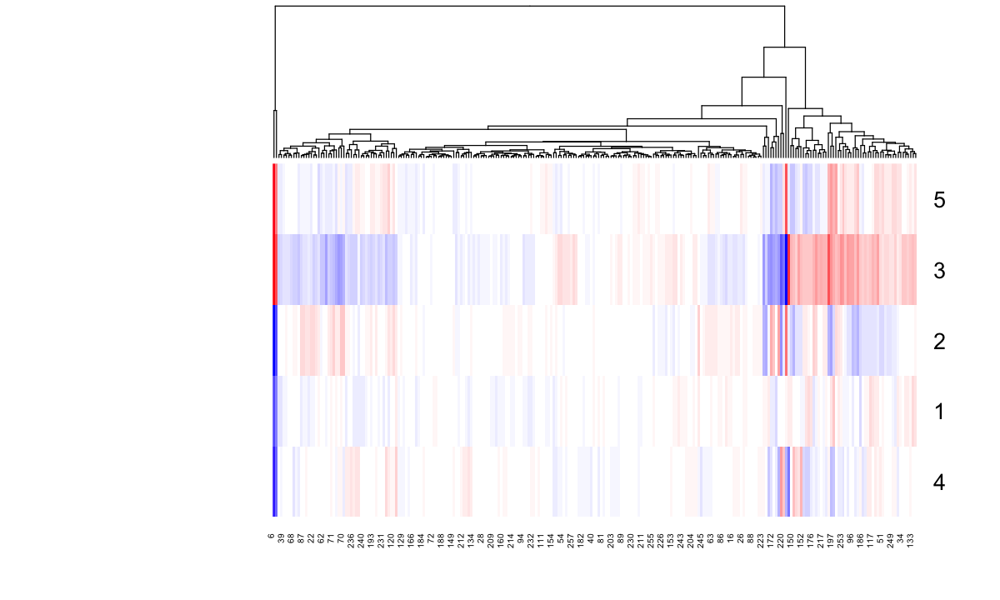

In [50]:
# Let's use the maximum a posteriori estimates of the different parameters to build the final model
MAP <- function(t){
    A<-density(t)
    return(A$x[which.max(A$y)])
}

require(gplots)
options(repr.plot.width=10, repr.plot.height=6)

W6 <- apply(extract(stan.pca,"W")[[1]], c(2,3), MAP)
heatmap.2(W6, col = bluered(70), dendrogram='none',trace='none', Rowv = FALSE, Colv = FALSE, key=FALSE)

Z6 <- apply(extract(stan.pca,"Z")[[1]], c(2,3), MAP)
heatmap.2(Z6, col = bluered(70), dendrogram ='column',trace='none', Rowv = TRUE, Colv = TRUE, key=FALSE)

In [ ]:
stan.book.pca <- "
	data {
		int<lower=0> N; // Number of samples
		int<lower=0> D; // The original dimension
		int<lower=0> K; // The latent dimension
		matrix[N, D] X; // The data matrix
	}

	parameters {
		matrix[N, K] Z; // The latent matrix
		matrix[D, K] W; // The weight matrix
		real<lower=0> tau; // Noise term 
		vector<lower=0>[K] alpha; // ARD prior
	}

	transformed parameters{
		vector<lower=0>[K] t_alpha;
		real<lower=0> t_tau;
                t_alpha = inv(sqrt(alpha));
                t_tau = inv(sqrt(tau));
	}
	model {
		tau ~ gamma(1,1);			
		to_vector(Z) ~ normal(0,1);
		alpha ~ gamma(1e-3,1e-3);				
		for(k in 1:K) W[,k] ~ normal(0, t_alpha[k]);
		to_vector(X) ~ normal(to_vector(Z*W'), t_tau);

	} "

In [8]:
# Add the data
stan.data <- list(K=8,
                  D=ncol(data),
                  N=nrow(data),
                  X=scale(data, center=TRUE))

stan.pca <- stan(model_code = stan.book.pca, data = stan.data, iter = 20000,
             chains =  3, verbose = FALSE, seed=101, warmup=700, control = list(max_treedepth = 15))

saveRDS(stan.pca, file='stan_pca_book_10k_iter.RDS')

Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#tail-ess”


Loading required package: gplots


Attaching package: ‘gplots’


The following object is masked from ‘package:stats’:

    lowess




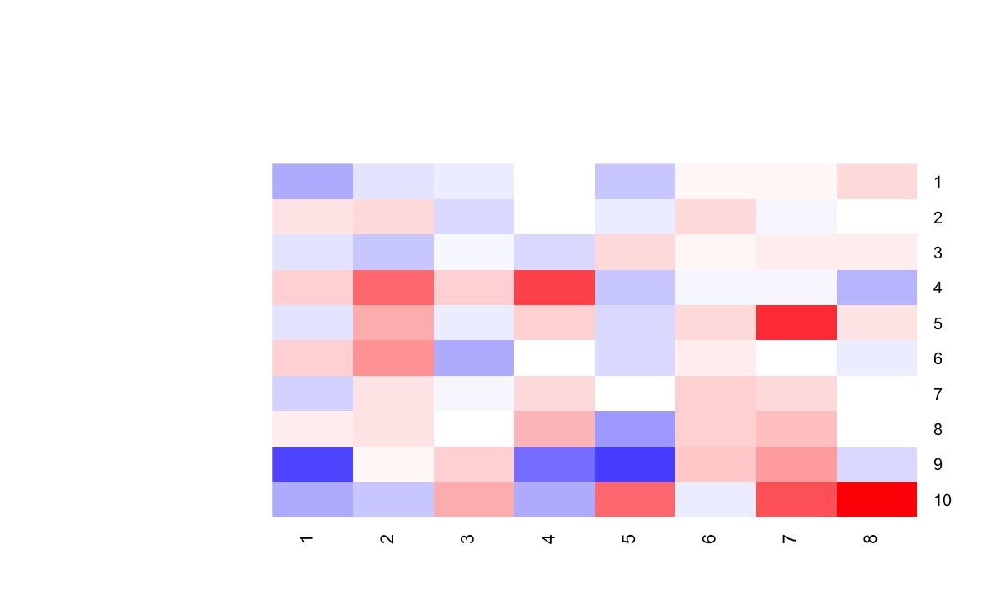

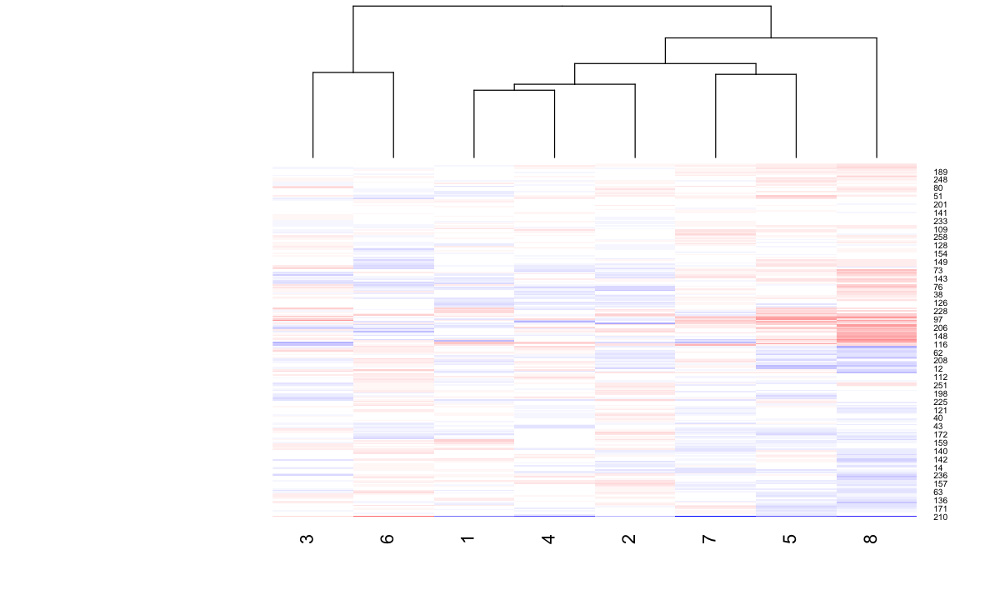

In [9]:
MAP <- function(t){
    A<-density(t)
    return(A$x[which.max(A$y)])
}

require(gplots)
options(repr.plot.width=10, repr.plot.height=6)

W6 <- apply(extract(stan.pca,"W")[[1]], c(2,3), MAP)
heatmap.2(W6, col = bluered(70), dendrogram='none',trace='none', Rowv = FALSE, Colv = FALSE, key=FALSE)

Z6 <- apply(extract(stan.pca,"Z")[[1]], c(2,3), MAP)
heatmap.2(Z6, col = bluered(70), dendrogram ='column',trace='none', Rowv = TRUE, Colv = TRUE, key=FALSE)